# Install dependacies and import libraries

Firstly we will need to install a few things, namely pytorch! Each time you run the notebook you'll need to reinstall.

In [1]:
!apt-get install libsndfile1 -y && pip3 install librosa http://download.pytorch.org/whl/cu80/torch-0.3.0.post4-cp36-cp36m-linux_x86_64.whl torchvision pysoundfile

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libsndfile1 is already the newest version (1.0.28-4).
0 upgraded, 0 newly installed, 0 to remove and 4 not upgraded.


In [0]:
# Url management.
import io
from six.moves.urllib.request import urlopen

# For teacher forcing.
import random

# Audio libraries.
import IPython
import librosa
import librosa.display
import soundfile as sf

# A very useful numerical package.
import numpy as np

# NumPy on steriods.
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
from torch.autograd import Variable

# Stats for outlier detection.
from scipy import stats
from sklearn import svm
from sklearn import decomposition
from sklearn.neighbors import LocalOutlierFactor

# To make nice plots.
import matplotlib.font_manager
import matplotlib.pyplot as plt

In [0]:
def to_var(x):
  if torch.cuda.is_available():
      x = x.cuda()
  return Variable(x)

# Build models

Now we build the generator and discriminator

In [0]:
class EncoderRNN(nn.Module):
  
  """The encoder takes a batch of FFT frame sequences and returns encodings.
  
  There are no embeddings as the inputs are already real values, and the
  objective is to take FFT frames sequences (batch_size, sequence_length,
  fft_size) and return the encodings (batch_size, sequence_length, hidden_size).
  """
  
  def __init__(self, 
               input_size, 
               batch_size,
               hidden_size, 
               number_layers=1, 
               dropout=0.1,
               bi_directional=True,
               rnn=nn.GRU):
    
    """The __init__ function.

    Sets up the encoder with the specified amount of layers and hidden size.
    Uses a different mask for each timestep, which has been shown to perform
    worse than if the mask was the same, for diffent layers at different
    timesteps as in https://arxiv.org/abs/1512.05287. So be wary of this! To
    entirely cancel out the dropout, just set dropout to zero.
    
    Arguments:
      input_size: Size of the input FFT frames.
      hidden_size: Size of the hidden learnable weights for the RNN.
      number_layers: How many layers the encoding RNN should have.
      dropout: Zero for no dropout, one for complete dropout.
      bi_directional: Whether or not the RNN should run in two directions.
      rnn_type: Pass a RNN module here such as nn.GRU or nn.LSTM.
    """
    
    super(EncoderRNN, self).__init__()
    
    self.input_size = input_size
    self.batch_size = batch_size
    self.hidden_size = hidden_size
    self.number_layers = number_layers
    self.dropout = dropout
    self.bi_directional = bi_directional
    self.rnn = rnn(input_size=input_size,
                   hidden_size=hidden_size,
                   num_layers=number_layers, 
                   bidirectional=bi_directional,
                   batch_first=True)
    
    
  def forward(self, x, hidden):
    """The forward propoagation function. 
    
    The 
    """
    
    x, hidden = self.rnn(x, hidden)
    
    # linearly sum bi-directional outputs if appropriate.
    if self.bi_directional:
      forward = x[:, :, :self.hidden_size]
      backward = x[:, : ,self.hidden_size:]
      x = forward + backward
    
    return x, hidden
  
  
  def init_hidden(self):
    """"""
    amount = 2 if self.bi_directional else 1
    tensor = torch.FloatTensor(self.number_layers * amount, 
                               self.batch_size, 
                               self.hidden_size)
    return to_var(tensor.fill_(0))

  
  
class Attention(nn.Module):
  
  """An attention module that can switch between different scoring methods.
  
  The general form of the attention calculation uses the target decoder hidden
  state and the encoder state.
  
  Find the scoring methods here: https://arxiv.org/abs/1508.04025. The options
  are; 'dot', a dot product between the decoder and encoder state; 'general', 
  the dot product between the decoder state and a linear transform of the
  encoder state; 'concat', a dot product between a new parameter 'v' and a 
  linear transform of the states concatenated together. Finally the result is
  normalised.
  """
  
  def __init__(self, method, batch_size, hidden_size, bias=True):
    super(Attention, self).__init__()
    
    self.method = method
    self.batch_size = batch_size
    self.hidden_size = hidden_size
    
    
    
    if self.method == 'general':
      self.attention = nn.Linear(hidden_size, hidden_size, bias=bias)
      
    elif self.method == 'concat':
      self.attention = nn.Linear(hidden_size * 2, hidden_size, bias=bias)
      self.v = nn.Parameter(torch.FloatTensor(batch_size, 1, hidden_size))
      
    
  def forward(self, hidden, encoder_outputs):
    max_length = encoder_outputs.size(1)
    
    if self.method == 'general':
      attention_energies = self.attention(encoder_outputs).transpose(2, 1)
      attention_energies = hidden.bmm(attention_energies)
    
    elif self.method == 'concat':
      # Broadcast hidden to encoder_outputs size.
      hidden *= to_var(encoder_outputs.data.new(encoder_outputs.size()).fill_(1))
      concat = torch.cat((hidden, encoder_outputs), -1)
      attention_energies = self.attention(concat)
      
      # Swap the second and first dimensions. 
      attention_energies = attention_energies.transpose(2, 1)
      attention_energies = self.v.bmm(attention_energies)
      
    else:
      # Method is 'dot'.
      encoder_outputs = encoder_outputs.transpose(2, 1)
      attention_energies = hidden.bmm(encoder_outputs)
      
    return F.softmax(attention_energies)
    
  
  
  def score(self, hidden, encoder_output):
    
    if self.method == 'dot':
      energy = hidden.dot(encoder_output)
      
    elif self.method == 'general':
      energy = self.attention(encoder_output)
      energy = hidden.dot(encoder_output)
      
    elif self.method == 'concat':
      concat = torch.cat((hidden, encoder_output), 1)
      energy = self.attention(concat)
      energy = self.v.dot(energy)
      
    return energy
      
        

class AttentionDecoderRNN(nn.Module):
  
  """Luong Attention Decoder RNN module.
  
  This decoder plugs in the Attention module ater the RNN to calculate the """
  
  def __init__(self, 
               attention_method,
               batch_size,
               hidden_size, 
               output_size, 
               number_layers=1, 
               dropout=0.1):
    
    super(AttentionDecoderRNN, self).__init__()
    
    self.attention_method = attention_method
    self.batch_size = batch_size
    self.hidden_size = hidden_size
    self.output_size = output_size
    self.number_layers = number_layers
    self.dropout = dropout
    
    self.rnn = nn.GRU(hidden_size, 
                      hidden_size, 
                      number_layers, 
                      dropout=dropout, 
                      batch_first=True)
    
    self.concat = nn.Linear(hidden_size * 2, hidden_size)
    self.output = nn.Linear(hidden_size, output_size)
    
    self.attention = Attention(attention_method, batch_size, hidden_size)
    
    
  def forward(self, input_sequence, last_hidden, encoder_outputs):
    
    # Get current hidden state from input sequence and last hidden state.
    rnn_output, hidden = self.rnn(input_sequence, last_hidden)
    
    # Calculate attention from the current RNN state and all encoder outputs.
    attention_weights = self.attention(rnn_output, encoder_outputs)
    
    # bmm = batch matrix matrix product. Apply attention to encoder outputs to
    # get the weighted average.
    context = attention_weights.bmm(encoder_outputs)
    
    # Attentional vector using the RNN hidden state and context vector
    # concatenated together (Luong eq. 5).
    concat_input = torch.cat((rnn_output, context), -1)
    concat_output = F.tanh(self.concat(concat_input))
    
    # Finally predict next frame (Luong eq. 6, without softmax).
    output = self.output(concat_output)
    
    # Return final output, hidden state, and attention weights. We can use the
    # attention weights for visualisation.
    return output, hidden, attention_weights
  
  
### WE COULD TRY A SEQ2SEQ ATTENTION MANY TO ONE DISCRIMINATOR
  
  
class DiscriminatorRNN(nn.Module):
  
  """A binary classifier for real and fake sequences in adverserial training.
  
  There are no embeddings as the inputs are already real values, and the
  objective is to take FFT frames sequences (batch_size, sequence_length,
  fft_size) and return a binary value on whether the sequence was real or not.
  """
  
  def __init__(self, 
               input_size, 
               batch_size,
               hidden_size, 
               number_layers=1, 
               dropout=0.1,
               bi_directional=True,
               rnn=nn.GRU):
    
    """The __init__ function.

    Sets up the rnn with the specified amount of layers and hidden size. Dropout
    uses a different mask for each timestep, which has been shown to perform
    worse than if the mask was the same, for different layers at different
    timesteps as in https://arxiv.org/abs/1512.05287. So be wary of this! To
    entirely cancel out the dropout, just set dropout to zero.
    
    Arguments:
      input_size: Size of the input FFT frames.
      hidden_size: Size of the hidden learnable weights for the RNN.
      number_layers: How many layers the encoding RNN should have.
      dropout: Zero for no dropout, one for complete dropout.
      bi_directional: Whether or not the RNN should run in two directions.
      rnn_type: Pass a RNN module here such as nn.GRU or nn.LSTM.
    """
    
    super(DiscriminatorRNN, self).__init__()
    
    self.input_size = input_size
    self.batch_size = batch_size
    self.hidden_size = hidden_size
    self.number_layers = number_layers
    self.dropout = dropout
    self.bi_directional = bi_directional
    self.rnn = rnn(input_size=input_size,
                   hidden_size=hidden_size,
                   num_layers=number_layers, 
                   bidirectional=bi_directional,
                   batch_first=True)
    self.dense = nn.Linear(hidden_size, 1)
    self.sigmoid = nn.Sigmoid()
    
    
  def forward(self, x, hidden):
    """The forward propoagation function. 
    
    The 
    """
    
    x, hidden = self.rnn(x, hidden)
    
    # linearly sum bi-directional outputs if appropriate.
    if self.bi_directional:
      forward  = x[:, :, :self.hidden_size]
      backward = x[:, :, self.hidden_size:]
      x = forward + backward
    
    x = self.dense(x[:, -1, :])
    x = self.sigmoid(x)
    return x, hidden

  
  def init_hidden(self):
    """"""
    amount = 2 if self.bi_directional else 1
    tensor = torch.FloatTensor(self.number_layers * amount, 
                               self.batch_size, 
                               self.hidden_size)
    return to_var(tensor.fill_(0))

# Test the encoder and decoder

In [0]:
if False:
  test_hidden_size     = 32
  test_input_size      = 32
  test_number_layers   = 3
  test_batch_size      = 16
  test_sequence_length = 7

  encoder_test = EncoderRNN(input_size=test_input_size,
                            batch_size=test_batch_size,
                            hidden_size=test_hidden_size,
                            number_layers=test_number_layers)
  
  decoder_test = AttentionDecoderRNN(attention_method='general',
                                     batch_size=test_batch_size,
                                     hidden_size=test_hidden_size,
                                     output_size=test_input_size,
                                     number_layers=test_number_layers)

  if torch.cuda.is_available():
    encoder_test.cuda()
    decoder_test.cuda()

  test_input_batches = to_var(torch.zeros(test_batch_size,
                                          test_sequence_length, 
                                          test_input_size))
  test_target_batches = to_var(torch.zeros(test_batch_size,
                                           test_sequence_length, 
                                           test_input_size))

  test_encoder_hidden = encoder_test.init_hidden()
  test_encoder_outputs, test_encoder_hidden = encoder_test(test_input_batches, 
                                                           test_encoder_hidden)

  # (batch_size, sequence_length, hidden_size)
  print('encoder outputs size      {}'.format(tuple(test_encoder_outputs.size())))

  # (number_layers * num_directions, sequence_length, hidden_size)
  print('encoder hidden state size {}'.format(tuple(test_encoder_hidden.size())))

  test_decoder_input = to_var(torch.zeros(test_batch_size, 
                                          test_sequence_length, 
                                          test_hidden_size))
  test_decoder_hidden = test_encoder_hidden[:decoder_test.number_layers]
 

  test_decoder_output, test_decoder_hidden, test_decoder_attention = \
    decoder_test(test_decoder_input, test_decoder_hidden, test_encoder_outputs)

  test_criterion = nn.MSELoss()
  test_loss = test_criterion(test_decoder_output, test_target_batches)
  print(test_loss.data[0])

# Utilites

You can look for music urls [here](https://www.jewelbeat.com/free/free-background-music.htm)

In [0]:
class AudioDataset():
  """A class to convert audio found at an url to magnitude frames."""
  
  def __init__(self, url, fft_size, hop_length):
    self.fft_size = fft_size
    self.feature_size = (fft_size // 2) + 1
    self.hop_length = hop_length
    self.data, self.sample_rate = sf.read(io.BytesIO(urlopen(url).read()))
    self.data = np.mean(self.data, axis=1)[:self.sample_rate * 20]
    self.stfts = librosa.stft(self.data, n_fft=fft_size, hop_length=hop_length)
    self.magnitudes, _ = librosa.magphase(self.stfts.T)
  
  
  def get_next_batch(self, amount_epochs, batch_size, sequence_length):
    
    self.dataset_size = len(self.magnitudes) - sequence_length * 2 - 1
    
    self.x = np.zeros((self.dataset_size, sequence_length, self.feature_size), 
                       dtype=np.float32)
    self.y = np.zeros((self.dataset_size, sequence_length, self.feature_size), 
                       dtype=np.float32)
    
    for i, x_start in enumerate(range(0, self.dataset_size)):
      y_start = x_end = x_start + sequence_length
      y_end = y_start + sequence_length

      self.x[i] = self.magnitudes[x_start:x_end]
      self.y[i] = self.magnitudes[y_start:y_end]
    
    for epoch in range(amount_epochs):
      
      permuation = np.random.permutation(len(self.x))
      x, y = self.x[permuation], self.y[permuation]

      for start in range(0, len(x) - batch_size, batch_size):
        end = start + batch_size

        batch_x = torch.from_numpy(x[start:end])
        batch_y = torch.from_numpy(y[start:end])

        yield to_var(batch_x), to_var(batch_y), epoch 
        
        
        
def griffin_lim(spectrogram, n_iter=100, window='hann', n_fft=2048, hop_length=-1):
  if hop_length == -1:
    hop_length = n_fft // 4

  angles = np.exp(2j * np.pi * np.random.rand(*spectrogram.shape))

  for i in range(n_iter):
    full = np.abs(spectrogram).astype(np.complex) * angles
    inverse = librosa.istft(full, hop_length = hop_length, window = window)
    rebuilt = librosa.stft(inverse, n_fft = n_fft, hop_length = hop_length, window = window)
    angles = np.exp(1j * np.angle(rebuilt))

  full = np.abs(spectrogram).astype(np.complex) * angles
  inverse = librosa.istft(full, hop_length = hop_length, window = window)

  return inverse
    
  
  
def outlier_detection(data, 
                      contamination_fraction=0.25, 
                      amount_neighbours=35, 
                      figure_width=8,
                      append_covariance=False,
                      inline=False):
  
  # Get rank-2 data points.
  number_data_points = len(data)
  data = np.array(data).reshape((number_data_points, -1))

  # perform dimensionality reduction if necessary for visualisation.
  if data.shape[1] > 2:
    pca = decomposition.PCA(n_components=2)
    pca.fit(data)
    data = pca.transform(data)
    
  # Setup.
  xx, yy = np.meshgrid(np.linspace(data.min(), data.max(), 100), 
                       np.linspace(data.min(), data.max(), 100))
    
  # Instanciate outlier detection methods and find anomolies & descision bounds.
  lof = LocalOutlierFactor(n_neighbors=amount_neighbours,
                           contamination=contamination_fraction)
  lof_predictions = lof.fit_predict(data)
  lof_scores_pred = lof.negative_outlier_factor_
  lof_threshold = stats.scoreatpercentile(lof_scores_pred, 
                                          100 * contamination_fraction)
  lof_z = lof._decision_function(np.c_[xx.ravel(), yy.ravel()])
  
  # Plot everything.
  plot_data = [
      ('Local Outlier Factor', lof_z, lof_threshold, lof_predictions)
  ]
  
  # Add robust covarince method. Need fix decision boundary!
  if append_covariance:
    env = EllipticEnvelope(contamination=contamination_fraction)
    env.fit(data)
    env_predictions = env.decision_function(data)
    env_scores_pred = env.predict(data)
    env_threshold = stats.scoreatpercentile(env_scores_pred,
                                            100 * contamination_fraction)
    env_z = env.decision_function(np.c_[xx.ravel(), yy.ravel()])
    cova_data = ('Robust Covariance', env_z, env_threshold, env_scores_pred)
    plot_data.append(cova_data)
    
  fig = plt.figure(figsize=(figure_width, figure_width * len(plot_data)))
  plot_number = 1
  for title, z, threshold, predictions in plot_data:
    z = z.reshape(xx.shape)
    sub_plot = fig.add_subplot(len(plot_data), 1, plot_number)
    sub_plot.contourf(xx, yy, z, levels=np.linspace(z.min(), threshold, 7), cmap=plt.cm.Blues_r)
    sub_plot.contour(xx, yy, z, levels=[threshold], linewidths=2, colors='red')
    sub_plot.contourf(xx, yy, z, levels=[threshold, z.max()], colors='orange')

    inliers = data[np.where(predictions == 1)]
    outliers = data[np.where(predictions == -1)]
    sub_plot.scatter(inliers[:,0], inliers[:,1], c='white', s=20, edgecolor='k')
    sub_plot.scatter(outliers[:,0], outliers[:,1], c='black', s=20, edgecolor='k')

    sub_plot.axis('tight')
    sub_plot.set_xlabel(title)
    sub_plot.set_xlim((data.min(), data.max()))
    sub_plot.set_ylim((data.min(), data.max()))
    
    plot_number += 1
  
  # Convert to NumPy array and return!
  fig.subplots_adjust(0.04, 0.1, 0.96, 0.94, 0.1, 0.26)
  fig.suptitle("Outlier detection")
  
  if not inline:
    plt.close()
  else:
    fig.savefig('outlier_detection.png', dpi=fig.dpi)
  
  return fig, np.where(lof_predictions == -1)[0]



def plot_audio(data):
  plt.figure()
  stft = librosa.amplitude_to_db(librosa.stft(data), ref=np.max)
  librosa.display.specshow(stft, y_axis='log')
  plt.show()
  

# Train and inference functions

In [0]:
def train(encoder, 
          decoder, 
          discriminator,
          encoder_optimiser,
          decoder_optimiser, 
          discriminator_optimiser,
          input_batch, 
          target_batch,
          criterion,
          discriminator_criterion,
          clip_threshold,
          lambda_a):
  
  # Zero the gradients of both optimisers.
  encoder_optimiser.zero_grad()
  decoder_optimiser.zero_grad()
  discriminator_optimiser.zero_grad()
  
  batch_size, sequence_length, fft_size = tuple(input_batch.size())
 
  #==================== Generate new sequence predictions. ====================#
  
  # Run the input batch of fft sequences through the encoder.
  encoder_hidden = encoder.init_hidden()
  encoder_outputs, encoder_hidden = encoder(input_batch, encoder_hidden)
  
  # Prepare the input and output variables.
  decoder_input = input_batch
  decoder_hidden = encoder_hidden[:decoder.number_layers]
  
  decoder_output, decoder_hidden, decoder_attention = \
    decoder(decoder_input, decoder_hidden, encoder_outputs)
  
  #========================= Train the discriminator. =========================#
  
  # Disable generator and enable discriminator backprop.
  for parameter in encoder.parameters():
    parameter.requires_grad = False
  for parameter in decoder.parameters():
    parameter.requires_grad = False
  for parameter in discriminator.parameters():
    parameter.requires_grad = True
  
  # Compute BCE loss using real sequences.
  discriminator_hidden = discriminator.init_hidden()
  real_inputs = torch.cat((input_batch, target_batch), 1)
  discriminator_outputs_real, _ = discriminator(real_inputs, 
                                                discriminator_hidden)
  real_labels = to_var(torch.ones(batch_size))
  discriminator_loss_real = discriminator_criterion(discriminator_outputs_real, 
                                                    real_labels)
  # Compute BCE loss using fake sequences.
  discriminator_hidden = discriminator.init_hidden()
  fake_inputs = torch.cat((input_batch, decoder_output), 1)
  discriminator_outputs_fake, _ = discriminator(fake_inputs, 
                                                discriminator_hidden)
  fake_labels = to_var(torch.zeros(batch_size))
  discriminator_loss_fake = discriminator_criterion(discriminator_outputs_fake, 
                                                    fake_labels)
  # Compute and backprop errors.
  discriminator_loss = (discriminator_loss_real + discriminator_loss_fake) * 0.5
  discriminator_loss.backward(retain_graph=True)
  
  torch.nn.utils.clip_grad_norm(discriminator.parameters(), clip_threshold)
  discriminator_optimiser.step()
  
  #=========================== Train the generator. ===========================#

  # Enable generator and disable discriminator backprop.
  for parameter in encoder.parameters():
    parameter.requires_grad = True
  for parameter in decoder.parameters():
    parameter.requires_grad = True
  for parameter in discriminator.parameters():
    parameter.requires_grad = False
  
  # How close were we to the targets? (MSE or L1 distance etc)
  distance_loss = criterion(decoder_output, target_batch) 
  
  # How many did the generator slip pass the discriminator?
  discriminator_loss = discriminator_criterion(discriminator_outputs_fake, 
                                               real_labels)
  discriminator_loss /= lambda_a
  loss = distance_loss + discriminator_loss
  loss.backward()
  
  # Clip the gradient norms.
  torch.nn.utils.clip_grad_norm(encoder.parameters(), clip_threshold)
  torch.nn.utils.clip_grad_norm(decoder.parameters(), clip_threshold)
  
  # Update parameters with optimisers.
  encoder_optimiser.step()
  decoder_optimiser.step()
  
  #========================= Return loss and outputs. =========================#
  
  # Average discriminator outputs with respect to objectives.
  mean_real_prediction = discriminator_outputs_real.data.mean()
  mean_fake_prediction = discriminator_outputs_fake.data.mean()
  
  return distance_loss.data[0], mean_real_prediction, mean_fake_prediction

In [0]:
def run(encoder, 
        decoder, 
        start_sequences,
        amount_frames):
  
  encoder.train(False)
  decoder.train(False)
  
  # Get random sequence from dataset object. 
  batch_size, sequence_length, fft_size = start_sequences.size()
  model_input = start_sequences.view(batch_size, sequence_length, fft_size)
  
  frames = np.zeros((amount_frames, batch_size, sequence_length, fft_size))
  
  # Repeatedly sample the RNN and get the output.
  for i in range(amount_frames):

    encoder_hidden = encoder.init_hidden()
    encoder_outputs, encoder_hidden = encoder(model_input, encoder_hidden)
    
    decoder_input = model_input
    decoder_hidden = encoder_hidden[:decoder.number_layers]
    
    decoder_output, decoder_hidden, _ = \
      decoder(decoder_input, decoder_hidden, encoder_outputs)

    model_input = decoder_output    
    frames[i] = Variable(decoder_output.data).cpu().data.numpy()
    
  encoder.train(True)
  decoder.train(True)
    
  return frames.reshape((batch_size, -1, fft_size))
  

# Hyper parameters

/usr/local/lib/python3.6/dist-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


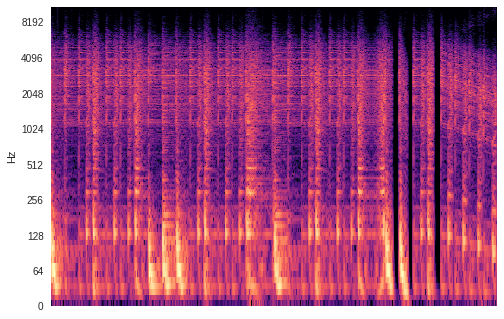

In [9]:
# Hyper parameters.
seed                   = 42
attention_method       = 'general'
fft_size               = 1024
number_layers          = 3
dropout                = 0.5 # 0.0
sequence_length        = 100 # was 50, 150 # 100 was best
clip_threshold         = 5.0
criterion              = nn.MSELoss() 
learning_rate          = 0.00005
decoder_learning_ratio = 5.0
batch_size             = 32 # was 64, 50
number_epochs          = 100
evaluate_every_epoch   = 5
lambda_a               = 10.0
beta_1                 = 0.5

feature_size = input_size = hidden_size = (fft_size // 2) + 1
hop_length = fft_size // 4
discriminator_criterion = nn.BCELoss()

# url = 'http://www.jewelbeat.com/free/free-music/JewelBeat%20-%20Haunted%20Revenge.wav'
url = 'http://doc.gold.ac.uk/~lfedd001/original_c.wav'

# Construct RNNs and optimisers.
encoder = EncoderRNN(input_size=feature_size,
                     batch_size=batch_size,
                     hidden_size=feature_size,
                     number_layers=number_layers,
                     dropout=dropout)

decoder = AttentionDecoderRNN(attention_method,
                              batch_size=batch_size,
                              hidden_size=hidden_size,
                              output_size=feature_size,
                              number_layers=number_layers,
                              dropout=dropout)

discriminator = DiscriminatorRNN(input_size=feature_size,
                                 batch_size=batch_size,
                                 hidden_size=feature_size,
                                 number_layers=number_layers,
                                 dropout=dropout)

# Enable GPU tensors provided GPUs actually exist!
if torch.cuda.is_available():
  encoder.cuda()
  decoder.cuda()
  criterion.cuda()
  discriminator_criterion.cuda()
  discriminator.cuda()
  torch.cuda.manual_seed(seed)
else:
  torch.manual_seed(seed)
  
encoder_optimiser = torch.optim.Adam(encoder.parameters(), 
                                     lr=learning_rate, 
                                     betas=(beta_1, 0.999))
decoder_optimiser = torch.optim.Adam(decoder.parameters(), 
                                     lr=learning_rate * decoder_learning_ratio, 
                                     betas=(beta_1, 0.999))
discriminator_optimiser = torch.optim.Adam(discriminator.parameters(),
                                           lr=learning_rate,
                                           betas=(beta_1, 0.999))

dataset = AudioDataset(url, fft_size, hop_length)

# Plot and listen to the audio.
plot_audio(dataset.data) 
IPython.display.Audio(dataset.data, rate=dataset.sample_rate)

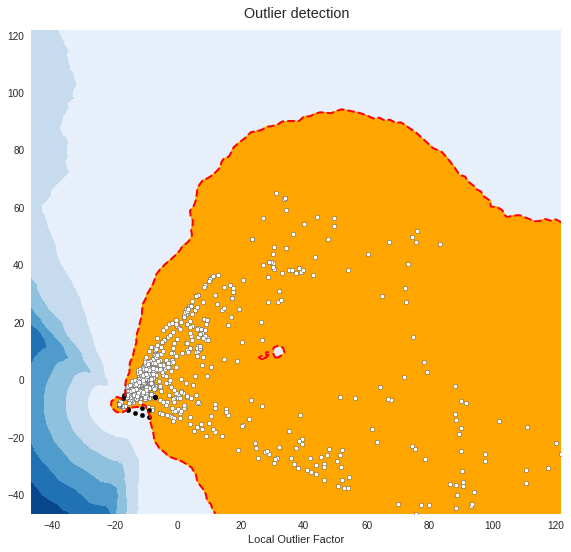

In [10]:
_ = outlier_detection(dataset.magnitudes, contamination_fraction=0.01, inline=True)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:132: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
/usr/local/lib/python3.6/dist-packages/librosa/util/utils.py:1725: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if np.issubdtype(x.dtype, float) or np.issubdtype(x.dtype, complex):
/usr/local/lib/python3.6/dist-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


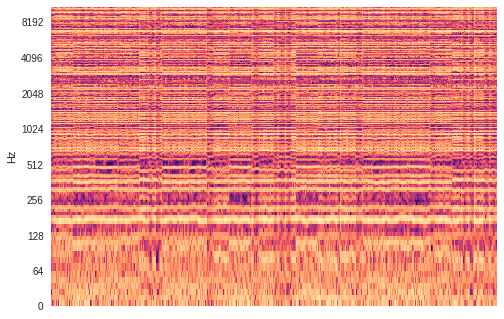

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1168: UserWarning: Using a target size (torch.Size([32])) that is different to the input size (torch.Size([32, 1])) is deprecated. Please ensure they have the same size.
  "Please ensure they have the same size.".format(target.size(), input.size()))


epoch 0/100, loss 3.8765175342559814, disc real 0.48467281460762024, disc fake 0.5151117444038391
epoch 0/100, loss 3.284240961074829, disc real 0.5641152858734131, disc fake 0.5165562033653259
epoch 0/100, loss 3.1569478511810303, disc real 0.634068489074707, disc fake 0.5411942005157471
epoch 0/100, loss 2.486833333969116, disc real 0.6989853978157043, disc fake 0.5652511715888977
epoch 0/100, loss 3.3589186668395996, disc real 0.7143261432647705, disc fake 0.5956142544746399
epoch 0/100, loss 2.752980947494507, disc real 0.7351681590080261, disc fake 0.6121976971626282
epoch 0/100, loss 3.211296319961548, disc real 0.7335281372070312, disc fake 0.6136430501937866
epoch 0/100, loss 2.812077283859253, disc real 0.7125171422958374, disc fake 0.6085466742515564
epoch 0/100, loss 2.892580986022949, disc real 0.6408073306083679, disc fake 0.5810983777046204
epoch 0/100, loss 2.6852262020111084, disc real 0.5937440395355225, disc fake 0.5479755401611328
epoch 0/100, loss 2.2682316303253174

epoch 1/100, loss 2.4129624366760254, disc real 0.6435033082962036, disc fake 0.3435097634792328
epoch 1/100, loss 2.1680350303649902, disc real 0.6366327404975891, disc fake 0.22695058584213257
epoch 1/100, loss 2.318936347961426, disc real 0.7739032506942749, disc fake 0.24582476913928986
epoch 1/100, loss 2.074868679046631, disc real 0.5794514417648315, disc fake 0.44075343012809753
epoch 1/100, loss 2.309530735015869, disc real 0.7669384479522705, disc fake 0.2891654968261719
epoch 1/100, loss 2.949301242828369, disc real 0.6799338459968567, disc fake 0.3069360554218292
epoch 1/100, loss 2.1576132774353027, disc real 0.6391594409942627, disc fake 0.11984284967184067
epoch 2/100, loss 2.2787630558013916, disc real 0.9140819311141968, disc fake 0.825449526309967
epoch 2/100, loss 1.9199055433273315, disc real 0.7672330141067505, disc fake 0.34406590461730957
epoch 2/100, loss 2.6574485301971436, disc real 0.4919472932815552, disc fake 0.3137734532356262
epoch 2/100, loss 2.4581592082

epoch 3/100, loss 2.0530693531036377, disc real 0.9890664219856262, disc fake 0.33816972374916077
epoch 3/100, loss 2.470362663269043, disc real 0.9855581521987915, disc fake 0.07149623334407806
epoch 3/100, loss 2.6407296657562256, disc real 0.9863572716712952, disc fake 0.1451890468597412
epoch 3/100, loss 2.4062983989715576, disc real 0.9842192530632019, disc fake 0.19401969015598297
epoch 3/100, loss 2.29734206199646, disc real 0.9826202988624573, disc fake 0.07299074530601501
epoch 3/100, loss 2.646906614303589, disc real 0.988458514213562, disc fake 0.24263423681259155
epoch 3/100, loss 1.8669378757476807, disc real 0.9937328100204468, disc fake 0.009419589303433895
epoch 3/100, loss 2.511209487915039, disc real 0.9941343665122986, disc fake 0.012036888860166073
epoch 3/100, loss 2.405775547027588, disc real 0.9937235116958618, disc fake 0.25697603821754456
epoch 3/100, loss 2.1824400424957275, disc real 0.9782596230506897, disc fake 0.02209378220140934
epoch 3/100, loss 1.907588

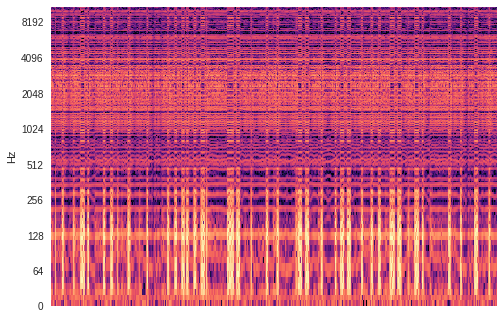

epoch 5/100, loss 2.1673755645751953, disc real 0.9201202392578125, disc fake 0.0214235857129097
epoch 5/100, loss 2.0304133892059326, disc real 0.970051109790802, disc fake 0.27873745560646057
epoch 5/100, loss 2.0067837238311768, disc real 0.9153827428817749, disc fake 0.03655656427145004
epoch 5/100, loss 2.377347230911255, disc real 0.9802457690238953, disc fake 0.051776010543107986
epoch 5/100, loss 3.0521676540374756, disc real 0.9498616456985474, disc fake 0.0822664424777031
epoch 5/100, loss 2.533015727996826, disc real 0.8984593749046326, disc fake 0.21175174415111542
epoch 5/100, loss 2.188039779663086, disc real 0.9921080470085144, disc fake 0.007658152841031551
epoch 5/100, loss 1.7177340984344482, disc real 0.9771568179130554, disc fake 0.00786788109689951
epoch 5/100, loss 2.1184308528900146, disc real 0.9908625483512878, disc fake 0.04171387851238251
epoch 5/100, loss 1.8359616994857788, disc real 0.9815767407417297, disc fake 0.021534983068704605
epoch 5/100, loss 1.845

epoch 6/100, loss 1.7552237510681152, disc real 0.9977850914001465, disc fake 0.002619493054226041
epoch 6/100, loss 1.8943835496902466, disc real 0.9969552159309387, disc fake 0.0026779617182910442
epoch 6/100, loss 1.6677788496017456, disc real 0.9970446228981018, disc fake 0.002377619966864586
epoch 6/100, loss 1.502766489982605, disc real 0.9962969422340393, disc fake 0.002533538034185767
epoch 6/100, loss 1.6892913579940796, disc real 0.9981245994567871, disc fake 0.002335191238671541
epoch 6/100, loss 2.05920147895813, disc real 0.997010350227356, disc fake 0.0028506366070359945
epoch 6/100, loss 1.5360782146453857, disc real 0.9974516034126282, disc fake 0.00250181439332664
epoch 6/100, loss 1.6920452117919922, disc real 0.998289942741394, disc fake 0.0024064797908067703
epoch 7/100, loss 1.8382859230041504, disc real 0.9976072907447815, disc fake 0.0022559345234185457
epoch 7/100, loss 1.8549206256866455, disc real 0.9977776408195496, disc fake 0.0029174659866839647
epoch 7/100

epoch 8/100, loss 1.8831274509429932, disc real 0.9967800974845886, disc fake 0.007161193992942572
epoch 8/100, loss 1.6151790618896484, disc real 0.9927138090133667, disc fake 0.07792650163173676
epoch 8/100, loss 1.7191287279129028, disc real 0.9971397519111633, disc fake 0.09846510738134384
epoch 8/100, loss 1.661180853843689, disc real 0.997596800327301, disc fake 0.07826382666826248
epoch 8/100, loss 1.7317419052124023, disc real 0.9975827932357788, disc fake 0.039001237601041794
epoch 8/100, loss 1.415102481842041, disc real 0.9952207207679749, disc fake 0.02941158227622509
epoch 8/100, loss 1.7436840534210205, disc real 0.9975234866142273, disc fake 0.0020818959455937147
epoch 8/100, loss 1.5939825773239136, disc real 0.9946488738059998, disc fake 0.015241345390677452
epoch 8/100, loss 1.5849111080169678, disc real 0.9972572326660156, disc fake 0.024531114846467972
epoch 8/100, loss 1.7513045072555542, disc real 0.9959879517555237, disc fake 0.0601959265768528
epoch 8/100, loss 

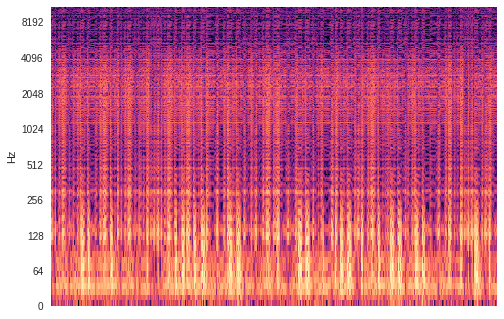

epoch 10/100, loss 1.6130399703979492, disc real 0.9647469520568848, disc fake 0.01694515533745289
epoch 10/100, loss 1.5292280912399292, disc real 0.9790211319923401, disc fake 0.19348952174186707
epoch 10/100, loss 1.411811351776123, disc real 0.7599142789840698, disc fake 0.06325887888669968
epoch 10/100, loss 1.6767324209213257, disc real 0.9856488108634949, disc fake 0.2461216300725937
epoch 10/100, loss 1.7079987525939941, disc real 0.8340054750442505, disc fake 0.22934004664421082
epoch 10/100, loss 1.6157606840133667, disc real 0.9904740452766418, disc fake 0.3232978284358978
epoch 10/100, loss 1.4925273656845093, disc real 0.9486516118049622, disc fake 0.16806869208812714
epoch 10/100, loss 1.3973867893218994, disc real 0.7446674704551697, disc fake 0.0069751073606312275
epoch 10/100, loss 1.5916695594787598, disc real 0.991289496421814, disc fake 0.022592050954699516
epoch 10/100, loss 1.3461973667144775, disc real 0.9740508198738098, disc fake 0.08781372010707855
epoch 10/10

epoch 11/100, loss 1.5088528394699097, disc real 0.917543888092041, disc fake 0.034715358167886734
epoch 11/100, loss 1.406163215637207, disc real 0.9905567765235901, disc fake 0.35688498616218567
epoch 11/100, loss 1.414851188659668, disc real 0.9765710234642029, disc fake 0.11920969933271408
epoch 11/100, loss 1.4029461145401, disc real 0.8656623363494873, disc fake 0.006746044848114252
epoch 11/100, loss 1.2955114841461182, disc real 0.9083526134490967, disc fake 0.00839658360928297
epoch 11/100, loss 1.2849586009979248, disc real 0.9782878756523132, disc fake 0.23050358891487122
epoch 11/100, loss 1.2221883535385132, disc real 0.9810667634010315, disc fake 0.24795828759670258
epoch 11/100, loss 1.559490442276001, disc real 0.9179507493972778, disc fake 0.017540181055665016
epoch 12/100, loss 1.302048921585083, disc real 0.9351226091384888, disc fake 0.020079057663679123
epoch 12/100, loss 1.3268829584121704, disc real 0.9713642001152039, disc fake 0.2284383773803711
epoch 12/100, l

epoch 13/100, loss 1.2777515649795532, disc real 0.9502500891685486, disc fake 0.022079914808273315
epoch 13/100, loss 1.0935419797897339, disc real 0.9819198250770569, disc fake 0.13915830850601196
epoch 13/100, loss 1.4500997066497803, disc real 0.9367491006851196, disc fake 0.022608304396271706
epoch 13/100, loss 1.2747161388397217, disc real 0.9153245687484741, disc fake 0.009972739964723587
epoch 13/100, loss 1.0563603639602661, disc real 0.9697152376174927, disc fake 0.07194346934556961
epoch 13/100, loss 1.4427621364593506, disc real 0.9459762573242188, disc fake 0.0174811240285635
epoch 13/100, loss 1.3258634805679321, disc real 0.9747287631034851, disc fake 0.027554437518119812
epoch 13/100, loss 1.2533559799194336, disc real 0.974948525428772, disc fake 0.03538694977760315
epoch 13/100, loss 1.3317188024520874, disc real 0.9542319774627686, disc fake 0.007545879110693932
epoch 13/100, loss 1.2119932174682617, disc real 0.9907599687576294, disc fake 0.01034229714423418
epoch 1

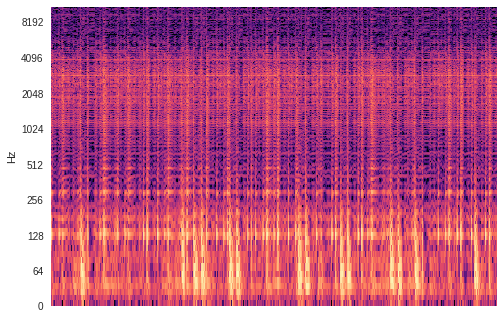

epoch 15/100, loss 1.0478780269622803, disc real 0.9940213561058044, disc fake 0.003565482795238495
epoch 15/100, loss 1.0028469562530518, disc real 0.9924012422561646, disc fake 0.013715188950300217
epoch 15/100, loss 0.9855735898017883, disc real 0.993598461151123, disc fake 0.0047775995917618275
epoch 15/100, loss 1.0799098014831543, disc real 0.9926989674568176, disc fake 0.014391863718628883
epoch 15/100, loss 1.3365137577056885, disc real 0.9890596866607666, disc fake 0.0028177504427731037
epoch 15/100, loss 1.1548501253128052, disc real 0.990888774394989, disc fake 0.0037141586653888226
epoch 15/100, loss 0.9544063806533813, disc real 0.9748227000236511, disc fake 0.003282878315076232
epoch 15/100, loss 0.8804742097854614, disc real 0.9931493401527405, disc fake 0.00475736241787672
epoch 15/100, loss 0.9038806557655334, disc real 0.9934738874435425, disc fake 0.01085212454199791
epoch 15/100, loss 0.9095986485481262, disc real 0.9913146495819092, disc fake 0.004188006743788719
e

epoch 16/100, loss 0.9935341477394104, disc real 0.9772600531578064, disc fake 0.027592815458774567
epoch 16/100, loss 1.021707534790039, disc real 0.9905515313148499, disc fake 0.021613970398902893
epoch 16/100, loss 1.0009098052978516, disc real 0.995273768901825, disc fake 0.04133574664592743
epoch 16/100, loss 1.4028348922729492, disc real 0.9924901723861694, disc fake 0.010732071474194527
epoch 16/100, loss 1.09259831905365, disc real 0.7353204488754272, disc fake 0.0032948406878858805
epoch 16/100, loss 1.0691111087799072, disc real 0.9903937578201294, disc fake 0.007862120866775513
epoch 16/100, loss 0.9905175566673279, disc real 0.9930463433265686, disc fake 0.04346725344657898
epoch 16/100, loss 1.378726840019226, disc real 0.9895073771476746, disc fake 0.014651883393526077
epoch 17/100, loss 1.1670864820480347, disc real 0.9737125039100647, disc fake 0.00451119476929307
epoch 17/100, loss 1.2434213161468506, disc real 0.9956977367401123, disc fake 0.03439662605524063
epoch 17

epoch 18/100, loss 1.183667778968811, disc real 0.9758940935134888, disc fake 0.03375159949064255
epoch 18/100, loss 0.8979983925819397, disc real 0.9333972334861755, disc fake 0.027235660701990128
epoch 18/100, loss 1.1004774570465088, disc real 0.9833610653877258, disc fake 0.04621186479926109
epoch 18/100, loss 0.8972383737564087, disc real 0.9828222990036011, disc fake 0.02136669121682644
epoch 18/100, loss 0.8508472442626953, disc real 0.9721037745475769, disc fake 0.016108999028801918
epoch 18/100, loss 1.1248369216918945, disc real 0.9841579794883728, disc fake 0.011833948083221912
epoch 18/100, loss 1.0869576930999756, disc real 0.9820230007171631, disc fake 0.013175231404602528
epoch 18/100, loss 0.9993781447410583, disc real 0.9867095351219177, disc fake 0.009413990192115307
epoch 18/100, loss 0.905207633972168, disc real 0.9898257255554199, disc fake 0.021539418026804924
epoch 18/100, loss 1.034367561340332, disc real 0.9784051179885864, disc fake 0.01437336765229702
epoch 1

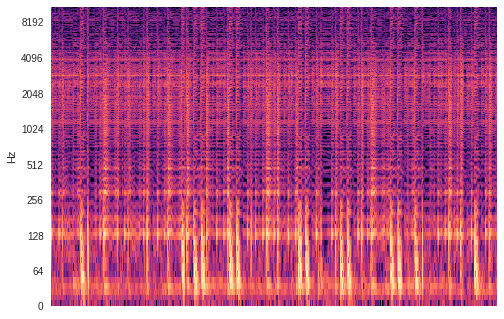

epoch 20/100, loss 0.9688458442687988, disc real 0.9956067800521851, disc fake 0.048484936356544495
epoch 20/100, loss 0.939015805721283, disc real 0.9947790503501892, disc fake 0.06351722031831741
epoch 20/100, loss 0.7946069240570068, disc real 0.9706200361251831, disc fake 0.009297600947320461
epoch 20/100, loss 0.8945369124412537, disc real 0.9838566184043884, disc fake 0.007818728685379028
epoch 20/100, loss 0.8652599453926086, disc real 0.9482058882713318, disc fake 0.005991054233163595
epoch 20/100, loss 0.7171275019645691, disc real 0.9917933344841003, disc fake 0.006670875940471888
epoch 20/100, loss 0.9946353435516357, disc real 0.994496762752533, disc fake 0.1778673529624939
epoch 20/100, loss 1.0714821815490723, disc real 0.9957833886146545, disc fake 0.036426153033971786
epoch 20/100, loss 0.985092282295227, disc real 0.9520559906959534, disc fake 0.0052903927862644196
epoch 20/100, loss 0.9701591730117798, disc real 0.9860492944717407, disc fake 0.014348842203617096
epoch

epoch 21/100, loss 0.7552032470703125, disc real 0.9924256801605225, disc fake 0.0024105084594339132
epoch 21/100, loss 0.7740722298622131, disc real 0.9966179132461548, disc fake 0.0024331826716661453
epoch 21/100, loss 0.8213984966278076, disc real 0.9977091550827026, disc fake 0.04472139850258827
epoch 21/100, loss 0.8952116966247559, disc real 0.9827662110328674, disc fake 0.001966519048437476
epoch 21/100, loss 0.7512698173522949, disc real 0.9245750904083252, disc fake 0.002186861354857683
epoch 21/100, loss 0.6357669830322266, disc real 0.997722864151001, disc fake 0.05407178774476051
epoch 21/100, loss 0.9153675436973572, disc real 0.9952273964881897, disc fake 0.028956739231944084
epoch 21/100, loss 0.7095273733139038, disc real 0.9747732877731323, disc fake 0.0018241252982988954
epoch 22/100, loss 0.726692259311676, disc real 0.9783934354782104, disc fake 0.002084579784423113
epoch 22/100, loss 0.6938554048538208, disc real 0.9759794473648071, disc fake 0.0018136760918423533


epoch 23/100, loss 0.7717817425727844, disc real 0.9084135890007019, disc fake 0.0010160970268771052
epoch 23/100, loss 0.7059101462364197, disc real 0.9829556345939636, disc fake 0.01670738495886326
epoch 23/100, loss 0.7361761331558228, disc real 0.998569905757904, disc fake 0.312177836894989
epoch 23/100, loss 0.834757924079895, disc real 0.9977504014968872, disc fake 0.11208566278219223
epoch 23/100, loss 0.7124022245407104, disc real 0.8176695108413696, disc fake 0.043846115469932556
epoch 23/100, loss 0.7380136251449585, disc real 0.917561948299408, disc fake 0.0018025207100436091
epoch 23/100, loss 0.770585298538208, disc real 0.9952146410942078, disc fake 0.01519011240452528
epoch 23/100, loss 0.7020878791809082, disc real 0.9954246878623962, disc fake 0.3944723904132843
epoch 23/100, loss 0.6489521861076355, disc real 0.9814615249633789, disc fake 0.04418513923883438
epoch 23/100, loss 0.8394852876663208, disc real 0.9491533041000366, disc fake 0.0038668750785291195
epoch 23/1

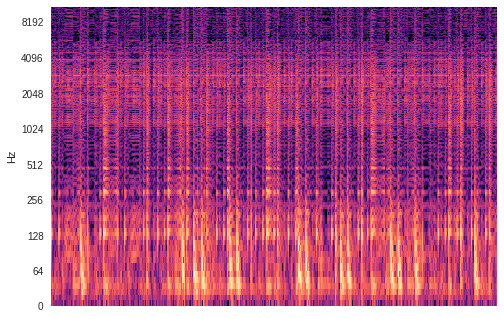

epoch 25/100, loss 0.6873522996902466, disc real 0.9938668012619019, disc fake 0.0030935206450521946
epoch 25/100, loss 0.5383445024490356, disc real 0.9838051795959473, disc fake 0.012442022562026978
epoch 25/100, loss 0.6382248997688293, disc real 0.9926091432571411, disc fake 0.016002779826521873
epoch 25/100, loss 0.6156424283981323, disc real 0.988474428653717, disc fake 0.00880638137459755
epoch 25/100, loss 0.6425361037254333, disc real 0.9847933053970337, disc fake 0.0028399850707501173
epoch 25/100, loss 0.5911291837692261, disc real 0.9893951416015625, disc fake 0.02084224484860897
epoch 25/100, loss 0.5846977829933167, disc real 0.8492319583892822, disc fake 0.0033009278122335672
epoch 25/100, loss 0.676952064037323, disc real 0.9962626099586487, disc fake 0.006666184868663549
epoch 25/100, loss 0.5897576212882996, disc real 0.9975051283836365, disc fake 0.19562430679798126
epoch 25/100, loss 0.6159430742263794, disc real 0.9923496842384338, disc fake 0.07196458429098129
epo

epoch 26/100, loss 0.6972029805183411, disc real 0.9776619076728821, disc fake 0.017839128151535988
epoch 26/100, loss 0.6049811244010925, disc real 0.9789258241653442, disc fake 0.007818031124770641
epoch 26/100, loss 0.7682852745056152, disc real 0.9837976694107056, disc fake 0.014678625389933586
epoch 26/100, loss 0.7426245212554932, disc real 0.9910063147544861, disc fake 0.012428236193954945
epoch 26/100, loss 0.7509443759918213, disc real 0.9299003481864929, disc fake 0.019002066925168037
epoch 26/100, loss 0.8969751596450806, disc real 0.9950863718986511, disc fake 0.5093351006507874
epoch 26/100, loss 0.7780330181121826, disc real 0.9933052659034729, disc fake 0.13206933438777924
epoch 26/100, loss 0.798211932182312, disc real 0.5828604102134705, disc fake 0.0025426221545785666
epoch 27/100, loss 0.7848412990570068, disc real 0.5863484740257263, disc fake 0.005071071442216635
epoch 27/100, loss 0.6571071147918701, disc real 0.9949012994766235, disc fake 0.04139472171664238
epoc

epoch 28/100, loss 0.5735679864883423, disc real 0.979728639125824, disc fake 0.028809811919927597
epoch 28/100, loss 0.8656235337257385, disc real 0.9919063448905945, disc fake 0.02485586144030094
epoch 28/100, loss 1.0063714981079102, disc real 0.988113522529602, disc fake 0.008923831395804882
epoch 28/100, loss 0.7808131575584412, disc real 0.9908597469329834, disc fake 0.006181490607559681
epoch 28/100, loss 0.6635265350341797, disc real 0.9702876806259155, disc fake 0.010715379379689693
epoch 28/100, loss 0.6046722531318665, disc real 0.9930723309516907, disc fake 0.057354241609573364
epoch 28/100, loss 0.6265908479690552, disc real 0.8800529837608337, disc fake 0.009298310615122318
epoch 28/100, loss 0.5656958818435669, disc real 0.993077278137207, disc fake 0.19201450049877167
epoch 28/100, loss 0.6573482155799866, disc real 0.6432201862335205, disc fake 0.0072547742165625095
epoch 28/100, loss 0.747690737247467, disc real 0.9840531945228577, disc fake 0.10755374282598495
epoch 

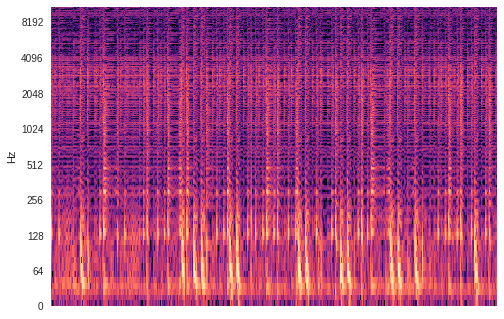

epoch 30/100, loss 0.7027697563171387, disc real 0.2664158344268799, disc fake 0.0040869442746043205
epoch 30/100, loss 0.6482972502708435, disc real 0.5536167621612549, disc fake 0.007534651551395655
epoch 30/100, loss 0.5714636445045471, disc real 0.9882408380508423, disc fake 0.512463390827179
epoch 30/100, loss 0.6355087161064148, disc real 0.9758482575416565, disc fake 0.06672444194555283
epoch 30/100, loss 0.6262739300727844, disc real 0.39699918031692505, disc fake 0.005398481152951717
epoch 30/100, loss 0.5777483582496643, disc real 0.6772944331169128, disc fake 0.011760408990085125
epoch 30/100, loss 0.5539918541908264, disc real 0.9831966757774353, disc fake 0.314963161945343
epoch 30/100, loss 0.5985067486763, disc real 0.984417200088501, disc fake 0.31970784068107605
epoch 30/100, loss 0.5899936556816101, disc real 0.5334053635597229, disc fake 0.011829753406345844
epoch 30/100, loss 0.5537628531455994, disc real 0.9319217801094055, disc fake 0.0278862826526165
epoch 30/100

epoch 31/100, loss 0.7177273631095886, disc real 0.9634550213813782, disc fake 0.3767918646335602
epoch 31/100, loss 0.7179529070854187, disc real 0.7828872799873352, disc fake 0.03466169163584709
epoch 31/100, loss 0.5799096822738647, disc real 0.9619320631027222, disc fake 0.4570956826210022
epoch 31/100, loss 0.5709592700004578, disc real 0.740746259689331, disc fake 0.10029329359531403
epoch 31/100, loss 0.668571412563324, disc real 0.9561425447463989, disc fake 0.48712852597236633
epoch 31/100, loss 0.6191183924674988, disc real 0.5131984353065491, disc fake 0.04767342656850815
epoch 31/100, loss 0.6136060953140259, disc real 0.915155291557312, disc fake 0.2404288947582245
epoch 31/100, loss 0.7100849151611328, disc real 0.28620538115501404, disc fake 0.02656707726418972
epoch 32/100, loss 0.657209575176239, disc real 0.9220982193946838, disc fake 0.41075363755226135
epoch 32/100, loss 0.6158674955368042, disc real 0.29385271668434143, disc fake 0.03191300109028816
epoch 32/100, l

epoch 33/100, loss 0.5224928259849548, disc real 0.6526361703872681, disc fake 0.11049526184797287
epoch 33/100, loss 0.47632232308387756, disc real 0.9690941572189331, disc fake 0.8084074854850769
epoch 33/100, loss 0.5228474736213684, disc real 0.9455459713935852, disc fake 0.4288025498390198
epoch 33/100, loss 0.46935421228408813, disc real 0.45309925079345703, disc fake 0.03346336632966995
epoch 33/100, loss 0.5193121433258057, disc real 0.732321560382843, disc fake 0.12292736768722534
epoch 33/100, loss 0.5055756568908691, disc real 0.9575910568237305, disc fake 0.766995370388031
epoch 33/100, loss 0.5783051252365112, disc real 0.9078773856163025, disc fake 0.3324797749519348
epoch 33/100, loss 0.5478458404541016, disc real 0.4092416763305664, disc fake 0.11474449187517166
epoch 33/100, loss 0.6349055171012878, disc real 0.7012990713119507, disc fake 0.21339312195777893
epoch 33/100, loss 0.47734707593917847, disc real 0.8694726824760437, disc fake 0.514724612236023
epoch 33/100, 

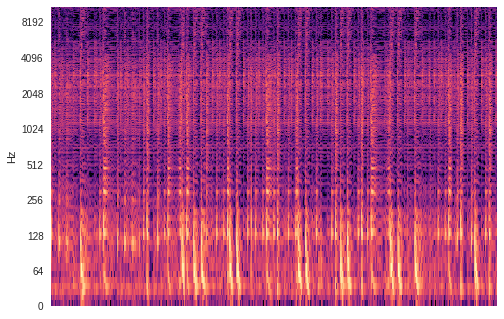

epoch 35/100, loss 0.4890914857387543, disc real 0.8765125274658203, disc fake 0.41123250126838684
epoch 35/100, loss 0.5967468619346619, disc real 0.48789483308792114, disc fake 0.07386288046836853
epoch 35/100, loss 0.554681122303009, disc real 0.8570584654808044, disc fake 0.37491074204444885
epoch 35/100, loss 0.5633076429367065, disc real 0.4233457148075104, disc fake 0.05163074657320976
epoch 35/100, loss 0.6308930516242981, disc real 0.8424367308616638, disc fake 0.2982519268989563
epoch 35/100, loss 0.6547567844390869, disc real 0.34040701389312744, disc fake 0.032039690762758255
epoch 35/100, loss 0.5470300912857056, disc real 0.840946614742279, disc fake 0.43209949135780334
epoch 35/100, loss 0.46807700395584106, disc real 0.34829002618789673, disc fake 0.04500158876180649
epoch 35/100, loss 0.56788569688797, disc real 0.8315243721008301, disc fake 0.42188751697540283
epoch 35/100, loss 0.5987261533737183, disc real 0.624489963054657, disc fake 0.12698990106582642
epoch 35/10

epoch 36/100, loss 0.5078690648078918, disc real 0.8558824062347412, disc fake 0.4359322786331177
epoch 36/100, loss 0.576898455619812, disc real 0.658835232257843, disc fake 0.19266033172607422
epoch 36/100, loss 0.5082289576530457, disc real 0.7556989192962646, disc fake 0.5510828495025635
epoch 36/100, loss 0.465728223323822, disc real 0.5008640885353088, disc fake 0.12922053039073944
epoch 36/100, loss 0.5062199831008911, disc real 0.8695051670074463, disc fake 0.48056289553642273
epoch 36/100, loss 0.5134024024009705, disc real 0.6412120461463928, disc fake 0.21259430050849915
epoch 36/100, loss 0.5155652761459351, disc real 0.39545443654060364, disc fake 0.1163514107465744
epoch 36/100, loss 0.4379304051399231, disc real 0.7658461332321167, disc fake 0.4047206938266754
epoch 37/100, loss 0.48503556847572327, disc real 0.8076859712600708, disc fake 0.2701840400695801
epoch 37/100, loss 0.44803914427757263, disc real 0.19394004344940186, disc fake 0.034046806395053864
epoch 37/100,

epoch 38/100, loss 0.38420382142066956, disc real 0.3358023166656494, disc fake 0.023472348228096962
epoch 38/100, loss 0.42932984232902527, disc real 0.5907830595970154, disc fake 0.08085121959447861
epoch 38/100, loss 0.3705219030380249, disc real 0.857937216758728, disc fake 0.6291998624801636
epoch 38/100, loss 0.3787296712398529, disc real 0.8475139737129211, disc fake 0.3560596704483032
epoch 38/100, loss 0.3931454122066498, disc real 0.34701645374298096, disc fake 0.05614539608359337
epoch 38/100, loss 0.37513816356658936, disc real 0.5974555611610413, disc fake 0.10311014950275421
epoch 38/100, loss 0.4480103552341461, disc real 0.8843954801559448, disc fake 0.7207871675491333
epoch 38/100, loss 0.42134788632392883, disc real 0.8846184611320496, disc fake 0.45795294642448425
epoch 38/100, loss 0.3251461684703827, disc real 0.3713385760784149, disc fake 0.08720600605010986
epoch 38/100, loss 0.47476834058761597, disc real 0.6420601010322571, disc fake 0.10048305243253708
epoch 3

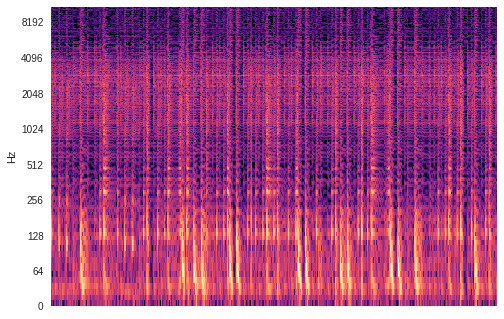

epoch 40/100, loss 0.3860873281955719, disc real 0.7963771820068359, disc fake 0.3728925883769989
epoch 40/100, loss 0.3984397053718567, disc real 0.6115112900733948, disc fake 0.0590008869767189
epoch 40/100, loss 0.3738250136375427, disc real 0.9030508995056152, disc fake 0.3977849781513214
epoch 40/100, loss 0.39424052834510803, disc real 0.7143473029136658, disc fake 0.13623042404651642
epoch 40/100, loss 0.3767184019088745, disc real 0.870377779006958, disc fake 0.3553922176361084
epoch 40/100, loss 0.41132181882858276, disc real 0.7639665007591248, disc fake 0.12555143237113953
epoch 40/100, loss 0.40209776163101196, disc real 0.8857784867286682, disc fake 0.28561916947364807
epoch 40/100, loss 0.4755542576313019, disc real 0.5419552326202393, disc fake 0.01918684132397175
epoch 40/100, loss 0.46574100852012634, disc real 0.8488193154335022, disc fake 0.167851522564888
epoch 40/100, loss 0.5104002356529236, disc real 0.5245567560195923, disc fake 0.05825024098157883
epoch 40/100,

epoch 41/100, loss 0.39543500542640686, disc real 0.5928817987442017, disc fake 0.10994672030210495
epoch 41/100, loss 0.35643360018730164, disc real 0.6303848624229431, disc fake 0.08262398838996887
epoch 41/100, loss 0.5028018355369568, disc real 0.9428884983062744, disc fake 0.7196943759918213
epoch 41/100, loss 0.40624797344207764, disc real 0.9362332224845886, disc fake 0.47465649247169495
epoch 41/100, loss 0.3844080865383148, disc real 0.5124973654747009, disc fake 0.09638261795043945
epoch 41/100, loss 0.3434881865978241, disc real 0.6438334584236145, disc fake 0.15585771203041077
epoch 41/100, loss 0.39060938358306885, disc real 0.9302730560302734, disc fake 0.6822762489318848
epoch 41/100, loss 0.39170578122138977, disc real 0.9169261455535889, disc fake 0.47627222537994385
epoch 42/100, loss 0.3936261534690857, disc real 0.5687839984893799, disc fake 0.09950486570596695
epoch 42/100, loss 0.4403741657733917, disc real 0.6803274750709534, disc fake 0.08573098480701447
epoch 4

epoch 43/100, loss 0.3793908655643463, disc real 0.5539498329162598, disc fake 0.08257931470870972
epoch 43/100, loss 0.42131081223487854, disc real 0.8646514415740967, disc fake 0.31921955943107605
epoch 43/100, loss 0.4183565080165863, disc real 0.6102774739265442, disc fake 0.06443649530410767
epoch 43/100, loss 0.4360862076282501, disc real 0.9114581346511841, disc fake 0.3645346760749817
epoch 43/100, loss 0.3844617009162903, disc real 0.6456793546676636, disc fake 0.15647339820861816
epoch 43/100, loss 0.4553740918636322, disc real 0.7843546271324158, disc fake 0.22578305006027222
epoch 43/100, loss 0.4420783817768097, disc real 0.49943989515304565, disc fake 0.06997545063495636
epoch 43/100, loss 0.42022863030433655, disc real 0.7237297892570496, disc fake 0.22408178448677063
epoch 43/100, loss 0.35244813561439514, disc real 0.7333160042762756, disc fake 0.29424530267715454
epoch 43/100, loss 0.4047733247280121, disc real 0.5895174741744995, disc fake 0.20049238204956055
epoch 4

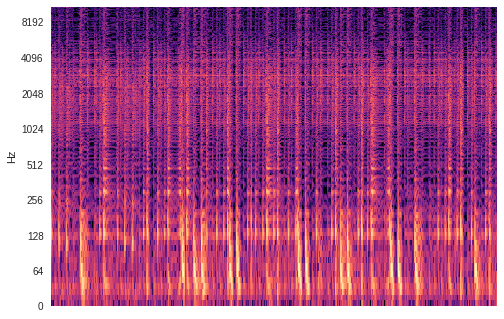

epoch 45/100, loss 0.4040524959564209, disc real 0.6065261363983154, disc fake 0.04056834429502487
epoch 45/100, loss 0.3397272229194641, disc real 0.780051052570343, disc fake 0.19254711270332336
epoch 45/100, loss 0.35726067423820496, disc real 0.7630761861801147, disc fake 0.20325341820716858
epoch 45/100, loss 0.3739418089389801, disc real 0.8590424060821533, disc fake 0.35606083273887634
epoch 45/100, loss 0.35395216941833496, disc real 0.6123014688491821, disc fake 0.0888642892241478
epoch 45/100, loss 0.3355378806591034, disc real 0.8808298110961914, disc fake 0.4926121234893799
epoch 45/100, loss 0.4688854217529297, disc real 0.507124125957489, disc fake 0.12171375751495361
epoch 45/100, loss 0.3606534004211426, disc real 0.774424135684967, disc fake 0.40434563159942627
epoch 45/100, loss 0.43370914459228516, disc real 0.6203393340110779, disc fake 0.10910537093877792
epoch 45/100, loss 0.3598642349243164, disc real 0.8576579093933105, disc fake 0.5910050868988037
epoch 45/100,

epoch 46/100, loss 0.3797488808631897, disc real 0.8060307502746582, disc fake 0.28722208738327026
epoch 46/100, loss 0.4285154640674591, disc real 0.2856990694999695, disc fake 0.05340416356921196
epoch 46/100, loss 0.3971080780029297, disc real 0.6047901511192322, disc fake 0.2271142601966858
epoch 46/100, loss 0.3286300003528595, disc real 0.6724601984024048, disc fake 0.3934837579727173
epoch 46/100, loss 0.38871100544929504, disc real 0.8160659670829773, disc fake 0.5485894680023193
epoch 46/100, loss 0.3348497748374939, disc real 0.5137364864349365, disc fake 0.1826310008764267
epoch 46/100, loss 0.34443527460098267, disc real 0.8117035031318665, disc fake 0.4608009159564972
epoch 46/100, loss 0.368882954120636, disc real 0.7840111255645752, disc fake 0.23913106322288513
epoch 47/100, loss 0.34609219431877136, disc real 0.36645209789276123, disc fake 0.0201874952763319
epoch 47/100, loss 0.3310379087924957, disc real 0.47333815693855286, disc fake 0.33416783809661865
epoch 47/100

epoch 48/100, loss 0.4012628197669983, disc real 0.8396658897399902, disc fake 0.6708943843841553
epoch 48/100, loss 0.3740531802177429, disc real 0.7331000566482544, disc fake 0.2987442910671234
epoch 48/100, loss 0.3280808627605438, disc real 0.0958733856678009, disc fake 0.034188248217105865
epoch 48/100, loss 0.2992342412471771, disc real 0.3269859552383423, disc fake 0.21835221350193024
epoch 48/100, loss 0.35637304186820984, disc real 0.8862743973731995, disc fake 0.4373847544193268
epoch 48/100, loss 0.3574342131614685, disc real 0.6011719107627869, disc fake 0.09959356486797333
epoch 48/100, loss 0.32256510853767395, disc real 0.8352525234222412, disc fake 0.4743969440460205
epoch 48/100, loss 0.382650762796402, disc real 0.6663334369659424, disc fake 0.12869612872600555
epoch 48/100, loss 0.346434623003006, disc real 0.7997876405715942, disc fake 0.4861164093017578
epoch 48/100, loss 0.34251484274864197, disc real 0.7749785780906677, disc fake 0.21813607215881348
epoch 48/100,

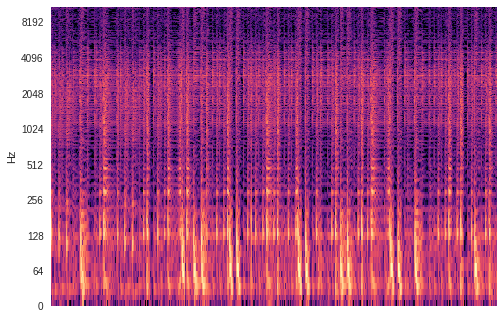

epoch 50/100, loss 0.3075852692127228, disc real 0.4734240174293518, disc fake 0.07809584587812424
epoch 50/100, loss 0.2776542007923126, disc real 0.7138066291809082, disc fake 0.45229747891426086
epoch 50/100, loss 0.2867346405982971, disc real 0.7122927308082581, disc fake 0.2519523501396179
epoch 50/100, loss 0.3063142001628876, disc real 0.6324190497398376, disc fake 0.2599933445453644
epoch 50/100, loss 0.3187509775161743, disc real 0.8132652640342712, disc fake 0.23143118619918823
epoch 50/100, loss 0.2958599030971527, disc real 0.6399937272071838, disc fake 0.18138393759727478
epoch 50/100, loss 0.27644479274749756, disc real 0.9342401027679443, disc fake 0.4744208753108978
epoch 50/100, loss 0.3359881341457367, disc real 0.8286487460136414, disc fake 0.19554251432418823
epoch 50/100, loss 0.3557657301425934, disc real 0.7659967541694641, disc fake 0.16267096996307373
epoch 50/100, loss 0.3082723319530487, disc real 0.9032215476036072, disc fake 0.2857353687286377
epoch 50/100,

KeyboardInterrupt: ignored

In [11]:
get_batch = dataset.get_next_batch(1, batch_size, sequence_length)
for x, y, epoch in get_batch:
  pass

indices = np.random.permutation(dataset.dataset_size)[:batch_size]
start_sequences = to_var(torch.from_numpy(dataset.x[indices]))

get_batch = dataset.get_next_batch(number_epochs, batch_size, sequence_length)

previous_epoch = -1

for x, y, epoch in get_batch:
  
  if previous_epoch != epoch and epoch % evaluate_every_epoch == 0:
    predicted_batch = run(encoder, decoder, start_sequences, 20)
    for i in range(1):
      predicted_audio = griffin_lim(predicted_batch[i].T, 
                                    n_iter=100, 
                                    window='hann', 
                                    n_fft=fft_size, 
                                    hop_length=hop_length)
      plot_audio(predicted_audio) 
    previous_epoch = epoch
  
  loss, mean_real_prediction, mean_fake_prediction = \
    train(encoder,
          decoder, 
          discriminator,
          encoder_optimiser,
          decoder_optimiser, 
          discriminator_optimiser,
          x, 
          y,
          criterion,
          discriminator_criterion,
          clip_threshold,
          lambda_a)
    
  print_str = "epoch {}/{}, loss {}, disc real {}, disc fake {}"
  print(print_str.format(epoch, 
                         number_epochs, 
                         loss,
                         mean_real_prediction,
                         mean_fake_prediction))


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:132: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
/usr/local/lib/python3.6/dist-packages/librosa/util/utils.py:1725: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if np.issubdtype(x.dtype, float) or np.issubdtype(x.dtype, complex):
/usr/local/lib/python3.6/dist-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


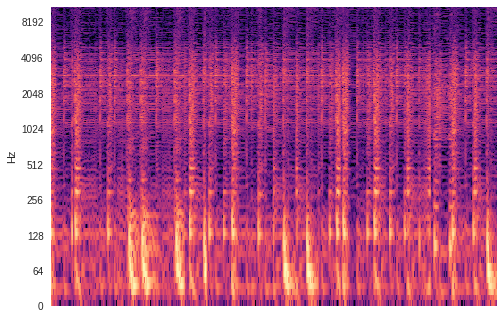

In [24]:
predicted_batch = run(encoder, decoder, start_sequences, 20)

predicted_audio_a = griffin_lim(predicted_batch[0].T, 
                                n_iter=100, 
                                window='hann', 
                                n_fft=fft_size, 
                                hop_length=hop_length)
plot_audio(predicted_audio_a) 

IPython.display.Audio(predicted_audio_a, rate=dataset.sample_rate)

/usr/local/lib/python3.6/dist-packages/librosa/util/utils.py:1725: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if np.issubdtype(x.dtype, float) or np.issubdtype(x.dtype, complex):
/usr/local/lib/python3.6/dist-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


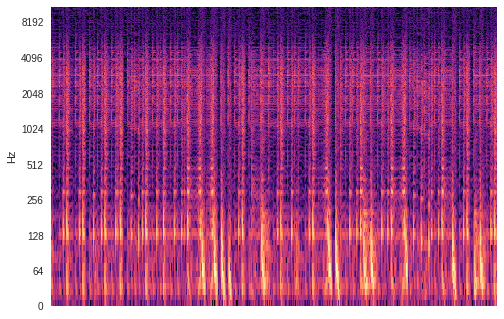

In [17]:
predicted_audio_b = griffin_lim(predicted_batch[1].T, 
                                n_iter=100, 
                                window='hann', 
                                n_fft=fft_size, 
                                hop_length=hop_length)
plot_audio(predicted_audio_b) 

IPython.display.Audio(predicted_audio_b, rate=dataset.sample_rate)

/usr/local/lib/python3.6/dist-packages/librosa/util/utils.py:1725: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if np.issubdtype(x.dtype, float) or np.issubdtype(x.dtype, complex):
/usr/local/lib/python3.6/dist-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


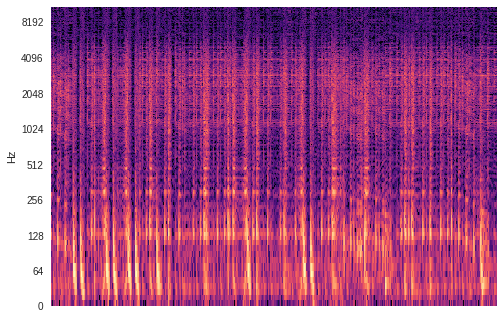

In [18]:
predicted_audio_c = griffin_lim(predicted_batch[2].T, 
                                n_iter=100, 
                                window='hann', 
                                n_fft=fft_size, 
                                hop_length=hop_length)
plot_audio(predicted_audio_c) 

IPython.display.Audio(predicted_audio_c, rate=dataset.sample_rate)

/usr/local/lib/python3.6/dist-packages/librosa/util/utils.py:1725: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if np.issubdtype(x.dtype, float) or np.issubdtype(x.dtype, complex):
/usr/local/lib/python3.6/dist-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


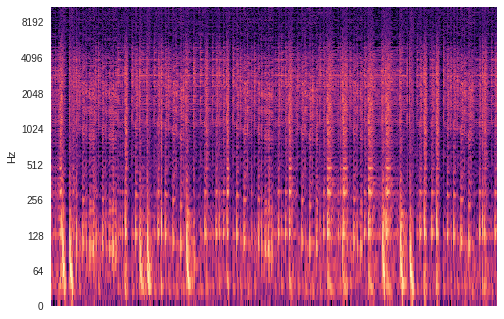

In [19]:
predicted_audio_d = griffin_lim(predicted_batch[3].T, 
                                n_iter=100, 
                                window='hann', 
                                n_fft=fft_size, 
                                hop_length=hop_length)
plot_audio(predicted_audio_d) 

IPython.display.Audio(predicted_audio_d, rate=dataset.sample_rate)